# Strategy Testing

## Strategy Description

### What is Granger?

### Iteration 1
- Using rolling single pair granger causality tests to determine which tokens are causal at any one point in time
- At that point, fit a multivaraite rolling granger causality to predict the next data point
- Trade with size determined by goodness of fit and predicted change 

- Vary across different time frames
- Keep window size fixed (1hr for minute data, 24 hr for hour data, 30 days for daily data)
#
___

In [6]:
# imports
import os
import sys
import logging
import warnings
import logging
from itertools import combinations

# add the parent directory to the path
sys.path.append(os.path.dirname(os.path.abspath('')))
from src.data.data_processor import DataProcessor
from src.visualization.causality_viz import CausalityVisualizer
from src.analysis.causality import CausalityAnalyzer
from src.analysis.granger_causality import AutomatedGrangerAnalyzer
from src.analysis.stationarity import StationarityTester
from src.analysis.outliers import OutlierAnalyzer
from src.analysis.time_varying_granger import run_tvgc_analysis
from src.utils.helpers import calculate_returns
from src.utils.load_data import load_parquet_data

from scipy import stats
import plotly.express as px
import pandas as pd
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.tsa.api import VAR


### 1. Load Data

In [33]:
data_dir = "../data/processed"
interval = "1m"

returns, prices = load_parquet_data(data_dir=data_dir, interval=interval)
log_returns = pd.DataFrame({key: returns[key].set_index('timestamp')["log_returns"] for key in returns.keys()}).dropna()

2025-01-08 08:44:16 - INFO - Initializing analyzer with data directory: ../data/processed
2025-01-08 08:44:16 - INFO - Starting data loading process...
2025-01-08 08:44:16 - INFO - Looking for parquet files in: c:\Users\owooding\Documents\GraduateScheme\Projects\CryptoCausality\data\processed
2025-01-08 08:44:16 - INFO - Found 6 parquet files
2025-01-08 08:44:16 - INFO - Processing file for ADAUSDT
2025-01-08 08:44:16 - INFO - Loaded 14401 rows for ADAUSDT
2025-01-08 08:44:16 - INFO - Calculating simple returns for ADAUSDT
2025-01-08 08:44:16 - INFO - Calculating price difference for ADAUSDT
2025-01-08 08:44:16 - INFO - Calculating log returns for ADAUSDT
2025-01-08 08:44:16 - INFO - Successfully processed ADAUSDT
2025-01-08 08:44:16 - INFO - Processing file for BNBUSDT
2025-01-08 08:44:16 - INFO - Loaded 14401 rows for BNBUSDT
2025-01-08 08:44:16 - INFO - Calculating simple returns for BNBUSDT
2025-01-08 08:44:16 - INFO - Calculating price difference for BNBUSDT
2025-01-08 08:44:16 - 

In [34]:
log_returns

,ADAUSDT,BNBUSDT,BTCUSDT,DOGEUSDT,ETHUSDT,XRPUSDT
timestamp,,,,,,
2024-12-08 00:01:00,-0.002320,-0.000280,-0.001002,-0.002319,-0.000886,-0.000423
2024-12-08 00:02:00,0.001409,-0.000853,0.000269,0.000884,0.000538,0.002228
2024-12-08 00:03:00,0.002813,0.001678,0.000791,0.003990,0.000445,0.001955
2024-12-08 00:04:00,0.001073,0.000266,0.000222,0.000132,0.000622,-0.002722
2024-12-08 00:05:00,0.000907,0.000000,-0.000120,-0.000968,0.000195,-0.002268
...,...,...,...,...,...,...
2024-12-17 23:56:00,0.003712,0.002191,0.001883,0.003375,0.002684,0.005462
2024-12-17 23:57:00,-0.002473,-0.000544,-0.001078,-0.001648,-0.001443,-0.002493
2024-12-17 23:58:00,0.000381,0.000279,0.000279,0.000304,0.000484,0.000390


In [8]:
def plot_time_series_data(data, column="close", title=None, symbol=None):
    if symbol != None: 
        fig = px.line(data[f'{symbol}USDT'], x="timestamp", y=column, title=f"{symbol} Close Price", height=500)  
        fig.show()
    else: 
        for symbol in data.keys():
            fig = px.line(data[symbol], x="timestamp", y=column, title=f"{symbol} Close Price", height=300)  
            fig.show()
    

plot_time_series_data(prices, column="close", title="Close Price")

### 2. Load Causal test data

**How results are used and interpreted**

- Time varying granger causality results for each pair in a single granger rolling model. Each model is run on 10 days of minute data with a rolling window of 300 minutes (5 hours) and a max lag of 100 minutes. 
- Gives the f-stat and p-value for each timestep which indicates the effectiveness of a multivariate OLS vs an autoregressive model over the window specified. 
- At each timestep, we should see which tokens are significant (p-value<0.5) and use them in a new multivariate VAR model to predict the next value of the target variable. 

*(Admittedly, the VAR model seems superior and should be used in isolation on a rolling basis but the impact of only using bivariate granger to determine the VAR variables may also be of interest. Both should be compared)*

**Issues**

- Only 10 days of data for initial test due to large computational requirement of rolling granger


**Assumptions**

To reduce the computational burden, a couple of assumptions are made...
- max lag: window should be restrained to 10: 1. it seems highly unlikely that there would be any value in data more than 10 minutes old. 2. Although in prior experimentation it is seen that upto a lag of 60 may be significant, lags below 10 also show high significance in comparison and so should equally produce good returns if the strategy is profitable. *Further lag analysis in future would be used if a MVP can be produced.*
- rolling window: This window should be balanced to control computational burden and the information included in training each prediction. For minute data, a window of 5 hours (300 min) seems sensible to capture emerging patterns. *A further analysis varying this should be conducted in future.*


In [9]:
# ANALYSIS VARS
TOKEN = "BTCUSDT"
INTERVAL = "1m"
RESULTS_DIR = "../results"

                  perc_significant  avg_length_significance
ADAUSDT_BTCUSDT           0.152060                24.056180
BNBUSDT_BTCUSDT           0.155540                16.222222
DOGEUSDT_BTCUSDT          0.111790                13.807018
ETHUSDT_BTCUSDT           0.194673                27.505051
XRPUSDT_BTCUSDT           0.131676                17.327103


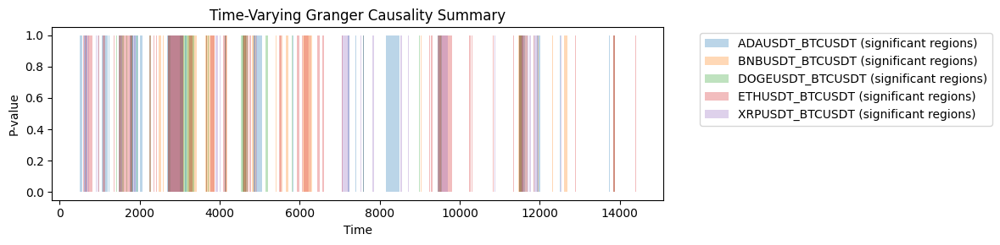

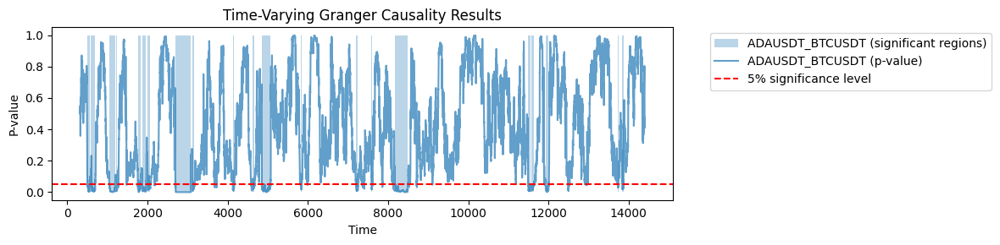

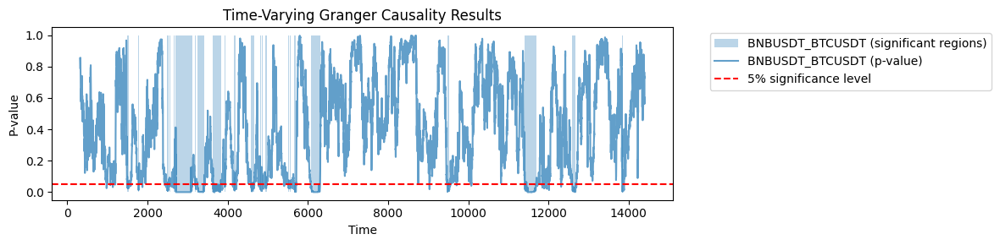

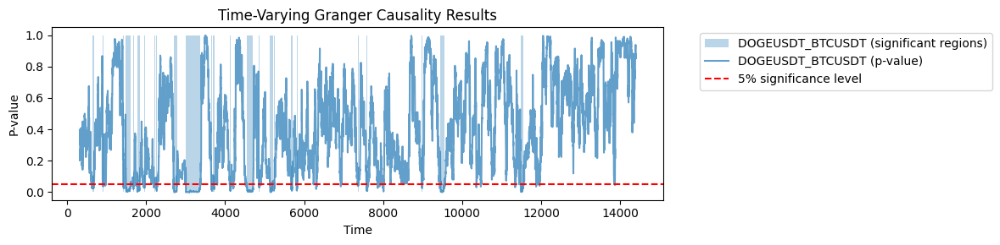

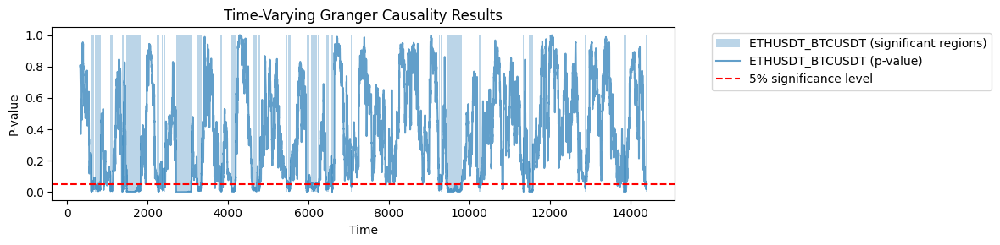

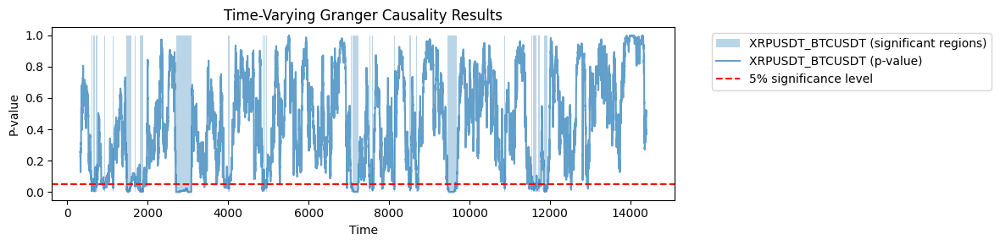

In [10]:
# GET RESULTS
def get_all_results(
    results_dir, token, interval="1m", type="time varying granger causality"
):
    results_dir = results_dir + f"/{interval}/"
    # get names of all files in the directory
    results = {}

    for file in os.listdir(results_dir):
        target_token = file.split("_")[1]
        # get all files with mathing target token and experiment type
        if (target_token == token) and (" ".join(file.split("_")[2:-1]) == type):
            results["_".join(file.split("_")[:2])] = pd.read_csv(results_dir + file)
    
    p_values_df = pd.DataFrame(index=prices[TOKEN].index)
    for symbol in results.keys():
        p_values_df[symbol] = results[symbol].set_index("date")["p_value"]

    # create summary of results
    summary = {"perc_significant": {token: 0 for token in results.keys()}, "avg_length_significance": {token: 0 for token in results.keys()}}
    for pair, result in results.items():
        summary["perc_significant"][pair] = result["significant"].sum() / len(result["significant"])
        # calculate average length of significance
        significance_lengths = []
        significant = result["significant"]
        counter = 0
        for i in range(len(significant)):
            if significant[i] == 1 and counter > 0:
                counter += 1
            elif significant[i] == 1 and counter == 0:
                counter = 1
            elif significant[i] == 0 and counter > 0:
                significance_lengths.append(counter)
                counter = 0

        summary["avg_length_significance"][pair] = sum(significance_lengths) / len(significance_lengths)

    return results, p_values_df, summary


# PLOT RESULTS
def plot_causality_results(
    tvgc_results, figsize=(12, 3), title="Time-Varying Granger Causality Results"
):  
    if figsize is None:
            fig_combined, ax_combined = plt.subplots(figsize=(10, 10))
    else:
        fig_combined, ax_combined = plt.subplots(figsize=figsize)
    
    for pair, results in tvgc_results.items():
        if figsize is None:
            fig, ax = plt.subplots(figsize=(10, 10))
        else:
            fig, ax = plt.subplots(figsize=figsize)

        # Plot significance regions
        ax.fill_between(
            results["date"],
            0,
            1,
            where=results["significant"],
            alpha=0.3,
            label=f"{pair} (significant regions)",
        )

        # Plot significance regions on combined plot
        ax_combined.fill_between(
            results["date"],
            0,
            1,
            where=results["significant"],
            alpha=0.3,
            label=f"{pair} (significant regions)",
        )

        # Plot p-values
        ax.plot(
            results["date"], results["p_value"], label=f"{pair} (p-value)", alpha=0.7
        )

        # format individual plots
        ax.axhline(y=0.05, color="r", linestyle="--", label="5% significance level")
        ax.set_title(title)
        ax.set_xlabel("Time")
        ax.set_ylabel("P-value")
        ax.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
        fig.tight_layout()
        fig.show()
    # format combined plot
    ax_combined.set_title("Time-Varying Granger Causality Summary")
    ax_combined.set_xlabel("Time")
    ax_combined.set_ylabel("P-value")
    ax_combined.legend(bbox_to_anchor=(1.05, 1), loc="upper left")
    fig_combined.tight_layout()
    fig_combined.show()

results, p_values_df, summary = get_all_results(RESULTS_DIR, TOKEN, interval=INTERVAL)
print(pd.DataFrame(summary))
plot_causality_results(results, title="Time-Varying Granger Causality Results")

### Interpretation
- It appears that there are windows of causality between smaller tokens and BTC, particularly for ETH. All tokens however have high causality at times and display significant results > 10% of the time. 
- ADA and ETH seem to have the largest average windows of causality of 24 and 27 minutes respectively. 
- Question: is causality just a reflection of momentum (one strong aspect of crypto). 1. If BTC is an AR progress, then momentum is reflected in this (lagged rise => continuted rise) but do other tokens acutally add anything or just also give momentum during trend and uncorrelated elsewhere.

In [11]:
# FIND GRANGER CAUSALITY
def rolling_multivariate_causality(
    returns_data,
    causal_results,
    target: str,
    window_size: int,
    max_lags: int,
    sig_level: float = 0.05,
) -> pd.DataFrame:
    """
    Run rolling multivariate Granger causality analysis using VAR model for only Granger-causal pairs :(

    Args:
        returns_data: DataFrame of all cryptocurrency returns
        causal_results: Dataframe of Granger causality results for each timestep and pair including target
        target: Target cryptocurrency to test causality for
        window_size: Size of rolling window
        max_lag: Maximum lag order for VAR model (default: None, uses AIC)
        sig_level: Significance level for p-values (default: 0.05)

    Returns:
        Tuple containing:
        - Dictionary of test statistics for each variable
        - Dictionary of coefficient p-values for each variable
        - Optimal lag order
    """
    # Set up logging with more detailed format
    logging.basicConfig(
        level=logging.INFO,
        format="%(asctime)s - %(levelname)s - %(message)s",
        datefmt="%Y-%m-%d %H:%M:%S",
    )
    logger = logging.getLogger(__name__)

    logger.info(f"Running multivariate causality analysis for target: {target}")

    # Prepare data
    data = returns_data
    data = data.dropna()

    stat_results = pd.DataFrame(columns=["f_stat", "p_value", "significant"], index=data.index)
    predictions = pd.DataFrame(columns=["pred", "significant_tokens"], index=data.index)
    # Rolling window analysis
    for start in range(0, len(data) - window_size + 1):
        logger.info(
            f"Running multivariate causality analysis for timestep {start}/{len(data) - window_size + 1}..."
        )

        date = data.index[start + window_size - 1]
        window_data = data.iloc[start : start + window_size]
        # causal results for this window
        significant_tokens = [
            col.split('_')[0] for col, val in causal_results.loc[date].items() if val < sig_level
        ]

        # if there are significant tokens run VAR model
        if len(significant_tokens) != 0:
            logger.info(f"Significant tokens found for date: {date} - running VAR model...")
            columns_to_use = [target] + significant_tokens
            window_data = window_data[columns_to_use]
            # print(window_data)

            # Fit VAR model
            model = VAR(window_data)
            results = model.fit(maxlags=max_lags, ic="aic")  # this automatically selects the best lag order

            # Predict next timestep
            lag_order = results.k_ar
            if lag_order == 0:
                continue
            else: 
                prediction = results.forecast(window_data.values[-lag_order:], 1)
                predictions.loc[date, "pred"] = prediction[0][0]  # select result only for target variable
                predictions.loc[date, "significant_tokens"] = significant_tokens

            # get test statistics and p-values for target variable
            f_stat = results.test_causality(target, significant_tokens, kind="f").test_statistic
            p_value = results.test_causality(target, significant_tokens, kind="f").pvalue
            
            logger.info(results.params)
            logger.info(f"VAR model fitted with max lag: {lag_order}")

            # Get test statistics and p-values for target variable
            target_idx = list(window_data.columns).index(target)
            
            # Store results
            stat_results.loc[date] = [f_stat, p_value, p_value < 0.05]

        else:
            logger.info(f"No significant tokens found for date: {date} - skipping VAR model...")

    return pd.DataFrame(predictions), pd.DataFrame(stat_results)



In [92]:
# running analysis
predictions, stat_results = rolling_multivariate_causality(log_returns, p_values_df, TOKEN, window_size=300, max_lags=10)

2025-01-07 11:09:01 - INFO - Running multivariate causality analysis for target: BTCUSDT
2025-01-07 11:09:01 - INFO - Running multivariate causality analysis for timestep 0/14101...
2025-01-07 11:09:01 - INFO - No significant tokens found for date: 300 - skipping VAR model...
2025-01-07 11:09:01 - INFO - Running multivariate causality analysis for timestep 1/14101...
2025-01-07 11:09:01 - INFO - No significant tokens found for date: 301 - skipping VAR model...
2025-01-07 11:09:01 - INFO - Running multivariate causality analysis for timestep 2/14101...
2025-01-07 11:09:01 - INFO - No significant tokens found for date: 302 - skipping VAR model...
2025-01-07 11:09:01 - INFO - Running multivariate causality analysis for timestep 3/14101...
2025-01-07 11:09:01 - INFO - No significant tokens found for date: 303 - skipping VAR model...
2025-01-07 11:09:01 - INFO - Running multivariate causality analysis for timestep 4/14101...
2025-01-07 11:09:01 - INFO - No significant tokens found for date:

<Axes: >

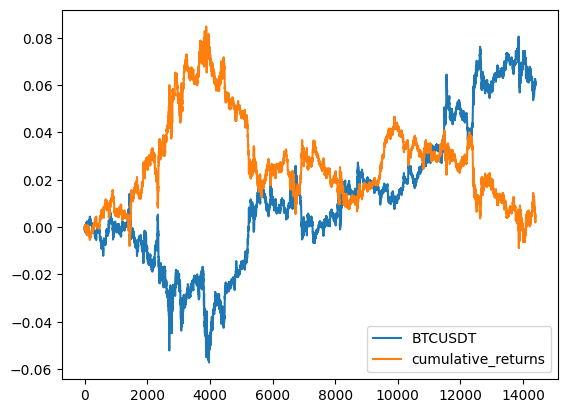

In [96]:
# trading strategy based off of granger causality
strategy = pd.DataFrame(index=prices[TOKEN].index)
strategy[TOKEN] = log_returns[TOKEN].cumsum()

# calculate signals
strategy["signal"] = 0
strategy["signal"].loc[predictions.index] = predictions["pred"].apply(lambda x: 1 if x > 0 else -1)

# calcualte returns
strategy["returns"] = log_returns[TOKEN] * strategy["signal"].shift(1)
strategy["cumulative_returns"] = strategy["returns"].cumsum()
strategy[[TOKEN, "cumulative_returns"]].plot()

### Reflection

- the model seems to work but the VAR disagrees with the granger causality in many places. (1257 values are not significant out of the 2019 predicted as significant by bi-granger)
- going to give up on this and do a rolling VAR with every coin, every time-step. 
- VAR lets you pull out the prediction for all variables at once - a trick to speed up calculations is to fit once, pull out all variable predictions. 
- Do we want any exogenous variables? 

In [19]:
import os
import pickle
import logging

import concurrent.futures

def save_checkpoint(result_dict, filename="checkpoint.pkl"):
    with open(filename, "wb") as f:
        pickle.dump(result_dict, f)

def load_checkpoint(filename="checkpoint.pkl"):
    if os.path.exists(filename):
        with open(filename, "rb") as f:
            return pickle.load(f)
    return None

def rolling_multivariate_causality_v2(
    returns_data,
    window_size: int,
    max_lags: int,
    sig_level: float = 0.05,
    checkpoint_interval: int = 100,
    checkpoint_file: str = "checkpoint.pkl"
) -> dict:
    """
    Run rolling multivariate Granger causality analysis using VAR model for all tokens!

    Args:
        returns_data: DataFrame of all cryptocurrency returns
        window_size: Size of rolling window
        max_lag: Maximum lag order for VAR model (default: None, uses AIC)
        sig_level: Significance level for p-values (default: 0.05)
        checkpoint_interval: Interval at which to save checkpoints
        checkpoint_file: File to save checkpoints

    Returns:
        Dictionary containing:
        - Test statistics for each variable
        - Coefficient p-values for each variable
        - Optimal lag order
    """
    # Set up logging with more detailed format
    logging.basicConfig(
        level=logging.INFO,
        format="%(asctime)s - %(levelname)s - %(message)s",
        datefmt="%Y-%m-%d %H:%M:%S",
    )
    logger = logging.getLogger(__name__)

    logger.info(f"Running multivariate causality analysis for all tokens")

    # Prepare data
    data = returns_data.dropna()

    # Initialize result data structures
    stat_results = pd.DataFrame(columns=["f_stat", "p_value", "significant"], index=data.index)
    predictions = pd.DataFrame(columns=["pred", "significant_tokens"], index=data.index)
    lag_order = pd.DataFrame(columns=["lag_order"], index=data.index)
    result_dict = {token: {'stats': stat_results.copy(), 'preds': predictions.copy()} for token in data.columns}
    result_dict['lag_order'] = lag_order

    # Load checkpoint if available
    checkpoint = load_checkpoint(checkpoint_file)
    if checkpoint:
        result_dict = checkpoint
        start_index = max(result_dict['lag_order'].dropna().index) + 1
    else:
        start_index = 0

    def process_window(start):
        logger.info(
            f"Running multivariate causality analysis for timestep {start}/{len(data) - window_size + 1}..."
        )

        date = data.index[start + window_size - 1]
        window_data = data.iloc[start : start + window_size]

        # Fit VAR model
        model = VAR(window_data)
        results = model.fit(maxlags=max_lags, ic="aic")  # this automatically selects the best lag order

        # Predict next timestep
        lag_order = results.k_ar
        result_dict['lag_order'].loc[date] = lag_order
        
        if lag_order == 0:
            return
        else: 
            prediction = results.forecast(window_data.values[-lag_order:], 1)

        for idx, target in enumerate(data.columns):
            other_tokens = [token for token in data.columns if token != target]

            # get predictions 
            result_dict[target]['preds'].loc[date, "pred"] = prediction[0][idx]  # select result only for target variable

            # find significant tokens
            causal_tokens = []
            for cause in other_tokens: 
                # Use F-test or Chi-square test statistic
                if results.test_causality(target, [cause], kind="f").test_statistic < sig_level:
                    causal_tokens.append(cause)
            result_dict[target]['preds'].loc[date, "significant_tokens"] = causal_tokens

            # get test statistics and p-values for target variable overall
            f_stat = results.test_causality(target, other_tokens, kind="f").test_statistic
            p_value = results.test_causality(target, other_tokens, kind="f").pvalue
            result_dict[target]['stats'].loc[date] = [f_stat, p_value, p_value < 0.05]

        # Save checkpoint at regular intervals
        if start % checkpoint_interval == 0:
            save_checkpoint(result_dict, checkpoint_file)
            logger.info(f"Checkpoint saved at timestep {start}")

    # Use ThreadPoolExecutor to parallelize the rolling window analysis
    with concurrent.futures.ThreadPoolExecutor() as executor:
        executor.map(process_window, range(start_index, len(data) - window_size + 1))

    # Save final results
    save_checkpoint(result_dict, checkpoint_file)
    logger.info("Final results saved")

    return result_dict

In [20]:
# running analysis - how long will this take?
WINDOW = 300
MAX_LAGS = 30

result_dict = rolling_multivariate_causality_v2(log_returns, window_size=WINDOW, max_lags=MAX_LAGS)


2025-01-07 20:01:03 - INFO - Running multivariate causality analysis for all tokens
2025-01-07 20:01:03 - INFO - Running multivariate causality analysis for timestep 0/101...
2025-01-07 20:01:03 - INFO - Running multivariate causality analysis for timestep 1/101...
2025-01-07 20:01:03 - INFO - Running multivariate causality analysis for timestep 2/101...
2025-01-07 20:01:03 - INFO - Running multivariate causality analysis for timestep 3/101...
2025-01-07 20:01:03 - INFO - Running multivariate causality analysis for timestep 4/101...
2025-01-07 20:01:03 - INFO - Running multivariate causality analysis for timestep 5/101...
2025-01-07 20:01:03 - INFO - Running multivariate causality analysis for timestep 6/101...
2025-01-07 20:01:03 - INFO - Running multivariate causality analysis for timestep 7/101...
2025-01-07 20:01:04 - INFO - Running multivariate causality analysis for timestep 8/101...
2025-01-07 20:01:04 - INFO - Running multivariate causality analysis for timestep 9/101...
2025-0

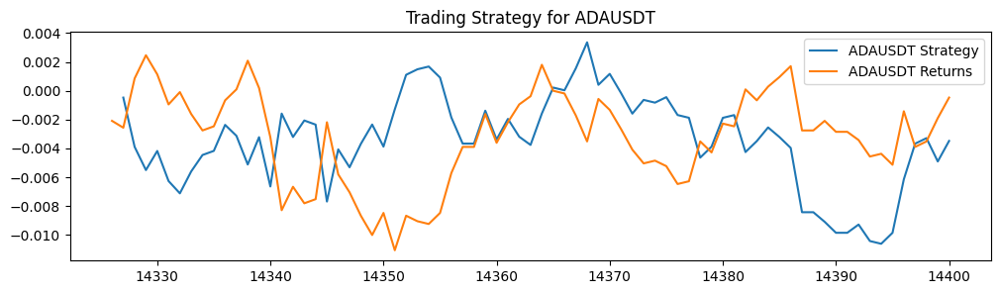

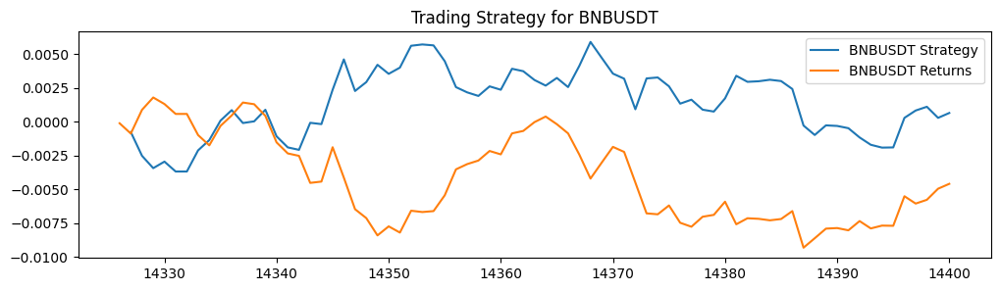

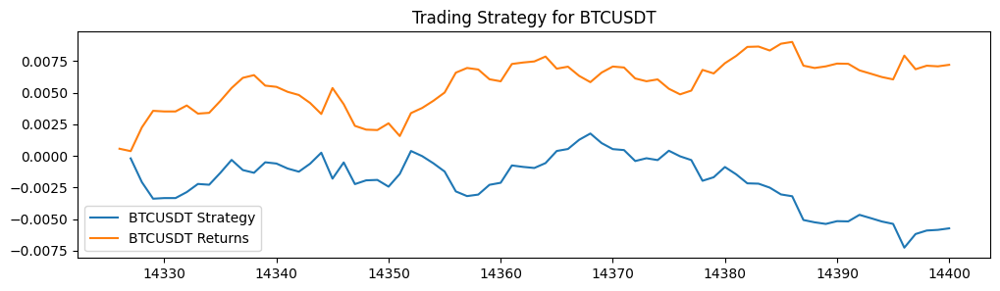

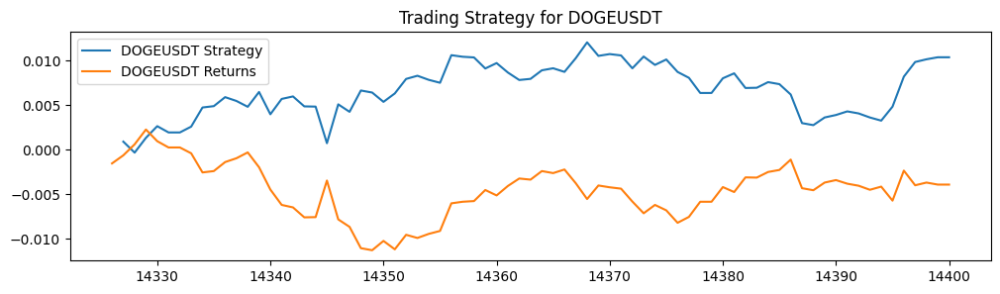

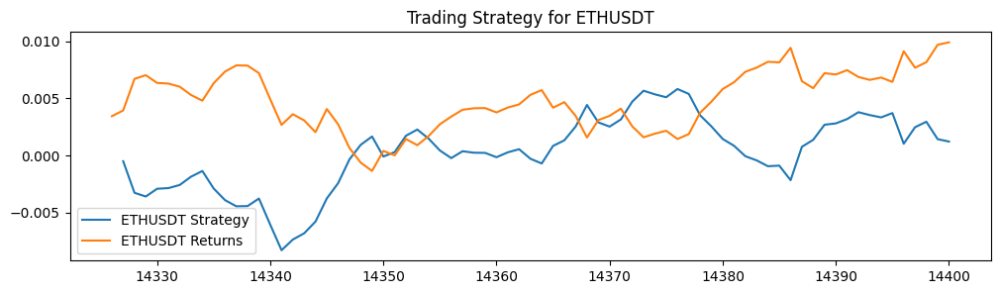

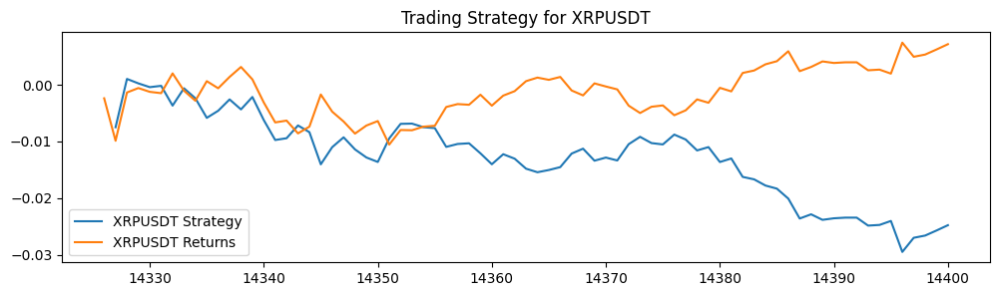

In [186]:
# Plot the results
for token in log_returns.columns:
    predictions = result_dict[token]['preds']
    stat_results = result_dict[token]['stats']
    # trading strategy based off of granger causality
    strategy = pd.concat([log_returns[token], predictions, stat_results], axis=1)
    strategy = strategy.dropna()
    # calculate signals
    strategy["signal"] = 0
    strategy["signal"] = strategy["pred"].apply(lambda x: 1 if x > 0 else -1)

    # calcualte returns
    strategy["returns"] = strategy[token] * strategy["signal"].shift(1)
    strategy["cumulative_returns"] = strategy["returns"].cumsum()

    # plot results
    fig, ax = plt.subplots(figsize=(12, 3))
    ax.plot(strategy["cumulative_returns"], label=f"{token} Strategy") 
    ax.plot(strategy[token].cumsum(), label=f"{token} Returns")
    ax.set_title(f"Trading Strategy for {token}")
    ax.legend()